In [2]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

tf.enable_eager_execution()

In [3]:
X = np.array([
				[0, 0],
				[0, 1],
				[1, 0],
				[1, 1]
			], dtype='float32')
y = np.array([
				[0],
				[1],
				[1],
				[0]
			], dtype='float32')
X, y

(array([[0., 0.],
        [0., 1.],
        [1., 0.],
        [1., 1.]], dtype=float32),
 array([[0.],
        [1.],
        [1.],
        [0.]], dtype=float32))

In [4]:
w0 = tf.Variable([
					[1, 2],
					[3, 4]
				], dtype='float32')
b0 = tf.Variable([[10, 20]], dtype='float32')
w0, b0

(<tf.Variable 'Variable:0' shape=(2, 2) dtype=float32, numpy=
 array([[1., 2.],
        [3., 4.]], dtype=float32)>,
 <tf.Variable 'Variable:0' shape=(1, 2) dtype=float32, numpy=array([[10., 20.]], dtype=float32)>)

In [5]:
tf.matmul(X, w0)

<tf.Tensor: id=21, shape=(4, 2), dtype=float32, numpy=
array([[0., 0.],
       [3., 4.],
       [1., 2.],
       [4., 6.]], dtype=float32)>

In [6]:
tf.matmul(X, w0) + b0

<tf.Tensor: id=26, shape=(4, 2), dtype=float32, numpy=
array([[10., 20.],
       [13., 24.],
       [11., 22.],
       [14., 26.]], dtype=float32)>

In [7]:
tf.sigmoid(tf.matmul(X, w0) + b0)

<tf.Tensor: id=32, shape=(4, 2), dtype=float32, numpy=
array([[0.9999546 , 1.        ],
       [0.99999774, 1.        ],
       [0.9999833 , 1.        ],
       [0.9999991 , 1.        ]], dtype=float32)>

In [8]:
hypothesis0 = tf.sigmoid(tf.matmul(X, w0) + b0)
hypothesis0

<tf.Tensor: id=38, shape=(4, 2), dtype=float32, numpy=
array([[0.9999546 , 1.        ],
       [0.99999774, 1.        ],
       [0.9999833 , 1.        ],
       [0.9999991 , 1.        ]], dtype=float32)>

In [9]:
w1 = tf.Variable([
					[5],
					[6]
				], dtype='float32')
w1

<tf.Variable 'Variable:0' shape=(2, 1) dtype=float32, numpy=
array([[5.],
       [6.]], dtype=float32)>

In [10]:
tf.matmul(hypothesis0, w1)

<tf.Tensor: id=49, shape=(4, 1), dtype=float32, numpy=
array([[10.999773],
       [10.999989],
       [10.999916],
       [10.999996]], dtype=float32)>

In [11]:
b1 = tf.Variable([[-4]], dtype='float32')
b1

<tf.Variable 'Variable:0' shape=(1, 1) dtype=float32, numpy=array([[-4.]], dtype=float32)>

In [12]:
tf.matmul(hypothesis0, w1) + b1

<tf.Tensor: id=62, shape=(4, 1), dtype=float32, numpy=
array([[6.999773 ],
       [6.9999886],
       [6.999916 ],
       [6.999996 ]], dtype=float32)>

In [13]:
tf.sigmoid(tf.matmul(hypothesis0, w1) + b1)

<tf.Tensor: id=67, shape=(4, 1), dtype=float32, numpy=
array([[0.99908876],
       [0.9990889 ],
       [0.9990889 ],
       [0.999089  ]], dtype=float32)>

In [14]:
hypothesis1 = tf.sigmoid(tf.matmul(hypothesis0, w1) + b1)
hypothesis1

<tf.Tensor: id=72, shape=(4, 1), dtype=float32, numpy=
array([[0.99908876],
       [0.9990889 ],
       [0.9990889 ],
       [0.999089  ]], dtype=float32)>

In [15]:
optimizer = tf.train.AdamOptimizer(0.1)

In [16]:
with tf.GradientTape() as tape :
	hypothesis0 = tf.sigmoid(tf.matmul(X, w0) + b0)
	hypothesis1 = tf.sigmoid(tf.matmul(hypothesis0, w1) + b1)

	# binary cross entropy
	cost = tf.reduce_mean(-y * tf.log(hypothesis1) - (1 - y) * tf.log(1 - hypothesis1))

	print('hypo0 = ', hypothesis0)
	print('hypo1 = ', hypothesis1)
	print('y\n', y)
	print('cost = ', cost)

grads = tape.gradient(cost, [w0, w1, b0, b1])

print('grad = ', grads)
print('before w0 = ', w0)
print('before b0 = ', b0)
print('before w1 = ', w1)
print('before b1 = ', b1)
print('-' * 100)

optimizer.apply_gradients(grads_and_vars=zip(grads, [w0, w1, b0, b1]))

print('after  w0 = ', w0)
print('after  b0 = ', b0)
print('after  w1 = ', w1)
print('after  b1 = ', b1)
print('=' * 100)


hypo0 =  tf.Tensor(
[[0.9999546  1.        ]
 [0.99999774 1.        ]
 [0.9999833  1.        ]
 [0.9999991  1.        ]], shape=(4, 2), dtype=float32)
hypo1 =  tf.Tensor(
[[0.99908876]
 [0.9990889 ]
 [0.9990889 ]
 [0.999089  ]], shape=(4, 1), dtype=float32)
y
 [[0.]
 [1.]
 [1.]
 [0.]]
cost =  tf.Tensor(3.5008757, shape=(), dtype=float32)
grad =  [<tf.Tensor: id=139, shape=(2, 2), dtype=float32, numpy=
array([[1.0975609e-06, 0.0000000e+00],
       [1.1139884e-06, 0.0000000e+00]], dtype=float32)>, <tf.Tensor: id=129, shape=(2, 1), dtype=float32, numpy=
array([[0.49907732],
       [0.49908888]], dtype=float32)>, <tf.Tensor: id=138, shape=(1, 2), dtype=float32, numpy=array([[5.7814093e-05, 0.0000000e+00]], dtype=float32)>, <tf.Tensor: id=127, shape=(1, 1), dtype=float32, numpy=array([[0.49908888]], dtype=float32)>]
before w0 =  <tf.Variable 'Variable:0' shape=(2, 2) dtype=float32, numpy=
array([[1., 2.],
       [3., 4.]], dtype=float32)>
before b0 =  <tf.Variable 'Variable:0' shape=(1, 2)

In [17]:
b0 = tf.Variable([
					[0, 0]
				], dtype='float32')
b1 = tf.Variable([0], dtype='float32')

In [20]:
for step in range(5000) :
	print('*' * 100)
	print('step = ', step)
	print('*' * 100)

	with tf.GradientTape() as tape :
		hypothesis0 = tf.sigmoid(tf.matmul(X, w0) + b0)
		hypothesis1 = tf.sigmoid(tf.matmul(hypothesis0, w1) + b1)

		# binary cross entropy
		cost = tf.reduce_mean(-y * tf.log(hypothesis1) - (1 - y) * tf.log(1 - hypothesis1))

		print('hypo0 = ', hypothesis0)
		print('hypo1 = ', hypothesis1)
		print('y\n', y)
		print('cost = ', cost)

	grads = tape.gradient(cost, [w0, w1, b0, b1])

	print('grad = ', grads)
	print('before w0 = ', w0)
	print('before b0 = ', b0)
	print('before w1 = ', w1)
	print('before b1 = ', b1)
	print('-' * 100)

	optimizer.apply_gradients(grads_and_vars=zip(grads, [w0, w1, b0, b1]))

	print('after  w0 = ', w0)
	print('after  b0 = ', b0)
	print('after  w1 = ', w1)
	print('after  b1 = ', b1)
	print('=' * 100)

****************************************************************************************************
step =  0
****************************************************************************************************
hypo0 =  tf.Tensor(
[[0.5        0.5       ]
 [0.9489287  0.98201376]
 [0.71552426 0.8807971 ]
 [0.9790507  0.99752736]], shape=(4, 2), dtype=float32)
hypo1 =  tf.Tensor(
[[0.9955038]
 [0.9999709]
 [0.9998339]
 [0.999977 ]], shape=(4, 1), dtype=float32)
y
 [[0.]
 [1.]
 [1.]
 [0.]]
cost =  tf.Tensor(4.0211024, shape=(), dtype=float32)
grad =  [<tf.Tensor: id=337, shape=(2, 2), dtype=float32, numpy=
array([[0.02508328, 0.00361232],
       [0.02512298, 0.00363728]], dtype=float32)>, <tf.Tensor: id=327, shape=(2, 1), dtype=float32, numpy=
array([[0.36915842],
       [0.37377036]], dtype=float32)>, <tf.Tensor: id=336, shape=(1, 2), dtype=float32, numpy=array([[0.3299546, 0.3707036]], dtype=float32)>, <tf.Tensor: id=325, shape=(1,), dtype=float32, numpy=array([0.4988214], dtype=float

In [21]:
w0

<tf.Variable 'Variable:0' shape=(2, 2) dtype=float32, numpy=
array([[ -9.247289 , -13.012109 ],
       [  9.8241625,  13.293756 ]], dtype=float32)>

In [22]:
b0

<tf.Variable 'Variable:0' shape=(1, 2) dtype=float32, numpy=array([[ 4.363741 , -7.4396763]], dtype=float32)>

In [23]:
w1

<tf.Variable 'Variable:0' shape=(2, 1) dtype=float32, numpy=
array([[-16.776619],
       [ 17.261831]], dtype=float32)>

In [24]:
b1

<tf.Variable 'Variable:0' shape=(1,) dtype=float32, numpy=array([8.072176], dtype=float32)>

# Multi Layer Perceptron 시각화

In [29]:
# 입력값을 2줄 100칸 랜덤함 값 (-1 ~ 1)
x_data1 = tf.random.uniform([2, 100], -1, 1)
x_data1

<tf.Tensor: id=490326, shape=(2, 100), dtype=float32, numpy=
array([[ 2.79927015e-01, -6.80039644e-01, -5.02898216e-01,
         8.15282583e-01,  3.02492380e-01, -2.30642796e-01,
         9.17025089e-01, -3.24916840e-03, -2.74657726e-01,
        -3.79664183e-01,  4.40264225e-01, -3.32280159e-01,
         2.91565657e-01,  8.23359489e-01,  5.92316151e-01,
         3.69396448e-01,  3.50382090e-01, -4.33343649e-01,
         3.11240196e-01, -9.15331841e-01,  6.44227743e-01,
        -8.98431778e-01,  8.81203413e-01,  4.79490519e-01,
        -5.00564575e-02, -9.31343317e-01,  7.22513676e-01,
         4.43073034e-01,  1.14716291e-01,  7.72401810e-01,
         1.97424412e-01,  8.22211981e-01, -6.23309851e-01,
        -1.39383078e-01,  4.15342331e-01, -3.07480097e-01,
         2.78594494e-01,  5.76042652e-01,  2.21494198e-01,
        -1.98534012e-01,  4.47943926e-01,  4.81962681e-01,
        -1.95788383e-01,  9.61790085e-01, -5.51126003e-02,
         7.84585476e-02, -1.30509853e-01, -7.91500568e

In [37]:
tf.sigmoid((x_data1[0] * w0[0][0] + x_data1[1] * w0[1][0]) + b0[0][0])

<tf.Tensor: id=490518, shape=(100,), dtype=float32, numpy=
array([9.97697294e-01, 1.00000000e+00, 9.99995053e-01, 1.51674122e-01,
       9.30911779e-01, 9.99067426e-01, 2.86186397e-01, 1.20200485e-01,
       9.99998987e-01, 9.68145847e-01, 5.40733337e-04, 9.94183540e-01,
       9.99782920e-01, 7.96139240e-04, 1.99049711e-04, 9.99389887e-01,
       2.52486050e-01, 3.84660423e-01, 1.84209436e-01, 9.99953985e-01,
       9.12835121e-01, 1.00000000e+00, 2.87918448e-02, 6.31585717e-03,
       9.99845147e-01, 9.84195352e-01, 5.01883030e-03, 9.98705506e-01,
       4.25263494e-01, 1.75535679e-05, 5.53995252e-01, 8.25949073e-01,
       9.99933362e-01, 9.98981714e-01, 8.77912760e-01, 9.99992490e-01,
       9.71862674e-02, 9.52721715e-01, 9.78991330e-01, 1.84266537e-01,
       5.44476211e-02, 9.99907732e-01, 9.93373036e-01, 1.00278854e-03,
       7.01353788e-01, 9.96454239e-01, 9.99935448e-01, 9.97363925e-01,
       9.90889609e-01, 9.87233102e-01, 9.99953866e-01, 9.99998569e-01,
       9.99910295e

In [38]:
linear00 = tf.sigmoid((x_data1[0] * w0[0][0] + x_data1[1] * w0[1][0]) + b0[0][0])
linear00

<tf.Tensor: id=490558, shape=(100,), dtype=float32, numpy=
array([9.97697294e-01, 1.00000000e+00, 9.99995053e-01, 1.51674122e-01,
       9.30911779e-01, 9.99067426e-01, 2.86186397e-01, 1.20200485e-01,
       9.99998987e-01, 9.68145847e-01, 5.40733337e-04, 9.94183540e-01,
       9.99782920e-01, 7.96139240e-04, 1.99049711e-04, 9.99389887e-01,
       2.52486050e-01, 3.84660423e-01, 1.84209436e-01, 9.99953985e-01,
       9.12835121e-01, 1.00000000e+00, 2.87918448e-02, 6.31585717e-03,
       9.99845147e-01, 9.84195352e-01, 5.01883030e-03, 9.98705506e-01,
       4.25263494e-01, 1.75535679e-05, 5.53995252e-01, 8.25949073e-01,
       9.99933362e-01, 9.98981714e-01, 8.77912760e-01, 9.99992490e-01,
       9.71862674e-02, 9.52721715e-01, 9.78991330e-01, 1.84266537e-01,
       5.44476211e-02, 9.99907732e-01, 9.93373036e-01, 1.00278854e-03,
       7.01353788e-01, 9.96454239e-01, 9.99935448e-01, 9.97363925e-01,
       9.90889609e-01, 9.87233102e-01, 9.99953866e-01, 9.99998569e-01,
       9.99910295e

In [40]:
linear00 = np.where(linear00 > 0.5, 1, 0)
linear00

array([1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1,
       0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0,
       1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1])

In [45]:
plt.style.use('ggplot')

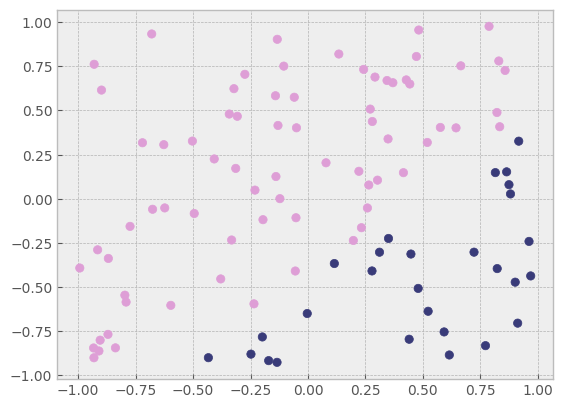

In [53]:
plt.scatter(x_data1[0], x_data1[1], c=linear00, cmap='tab20b')
plt.show()

In [54]:
x_data2 = tf.random.uniform([2, 100], -1, 1)
x_data2

<tf.Tensor: id=490889, shape=(2, 100), dtype=float32, numpy=
array([[ 0.61186385,  0.76424026, -0.14629436, -0.29467106,  0.00258851,
         0.53886175,  0.9882009 , -0.58567   , -0.4768622 , -0.48096442,
         0.9187045 , -0.04942727, -0.5895715 ,  0.58550954, -0.31159544,
        -0.03176141,  0.08601618,  0.4151435 ,  0.4686842 ,  0.46919775,
         0.81090045, -0.4615984 ,  0.48255038,  0.3623724 ,  0.76244783,
        -0.78673553,  0.4143226 ,  0.9582615 , -0.2798028 , -0.93307114,
        -0.93534374,  0.98154306,  0.69624543,  0.29847193, -0.3693943 ,
        -0.01061177, -0.460474  ,  0.94331694, -0.5623901 ,  0.13695097,
         0.72609186,  0.95290923, -0.4571519 , -0.06559944, -0.35589504,
        -0.42363858,  0.5602169 , -0.43724084, -0.7151234 ,  0.6563206 ,
         0.20547795, -0.90490675,  0.5025606 , -0.96210575, -0.47747445,
         0.7898078 , -0.6991613 ,  0.9158845 ,  0.12917733,  0.42324758,
        -0.89310956, -0.59573746,  0.6795032 , -0.9995909 , -0.

In [55]:
tf.sigmoid((x_data2[0] * w0[0][1] + x_data2[1] * w0[1][1]) + b0[0][1])

<tf.Tensor: id=490929, shape=(100,), dtype=float32, numpy=
array([2.19047070e-05, 0.00000000e+00, 9.96839285e-01, 9.05023575e-01,
       2.68220901e-07, 1.63912773e-06, 0.00000000e+00, 6.42857552e-01,
       3.85046005e-05, 9.97888207e-01, 5.66244125e-07, 4.36588049e-01,
       4.98553276e-01, 1.98781490e-05, 1.71065331e-05, 2.38418579e-07,
       1.03116035e-05, 7.94231892e-05, 5.96046448e-08, 8.18550587e-04,
       1.40070915e-06, 9.98780370e-01, 1.78813934e-07, 0.00000000e+00,
       0.00000000e+00, 9.99990702e-01, 0.00000000e+00, 0.00000000e+00,
       8.77702236e-03, 9.99995708e-01, 1.00000000e+00, 3.27825546e-07,
       0.00000000e+00, 6.67572021e-06, 9.98080790e-01, 3.03387642e-05,
       1.48564577e-04, 1.07288361e-05, 3.00942570e-01, 5.70202470e-01,
       1.58995390e-04, 1.54972076e-06, 9.99986589e-01, 9.92161512e-01,
       9.99298930e-01, 1.78813934e-07, 0.00000000e+00, 8.40501308e-01,
       9.88366485e-01, 0.00000000e+00, 3.01003456e-06, 9.87752318e-01,
       2.52187252e

In [56]:
linear01 = tf.sigmoid((x_data2[0] * w0[0][1] + x_data2[1] * w0[1][1]) + b0[0][1])
linear01

<tf.Tensor: id=490969, shape=(100,), dtype=float32, numpy=
array([2.19047070e-05, 0.00000000e+00, 9.96839285e-01, 9.05023575e-01,
       2.68220901e-07, 1.63912773e-06, 0.00000000e+00, 6.42857552e-01,
       3.85046005e-05, 9.97888207e-01, 5.66244125e-07, 4.36588049e-01,
       4.98553276e-01, 1.98781490e-05, 1.71065331e-05, 2.38418579e-07,
       1.03116035e-05, 7.94231892e-05, 5.96046448e-08, 8.18550587e-04,
       1.40070915e-06, 9.98780370e-01, 1.78813934e-07, 0.00000000e+00,
       0.00000000e+00, 9.99990702e-01, 0.00000000e+00, 0.00000000e+00,
       8.77702236e-03, 9.99995708e-01, 1.00000000e+00, 3.27825546e-07,
       0.00000000e+00, 6.67572021e-06, 9.98080790e-01, 3.03387642e-05,
       1.48564577e-04, 1.07288361e-05, 3.00942570e-01, 5.70202470e-01,
       1.58995390e-04, 1.54972076e-06, 9.99986589e-01, 9.92161512e-01,
       9.99298930e-01, 1.78813934e-07, 0.00000000e+00, 8.40501308e-01,
       9.88366485e-01, 0.00000000e+00, 3.01003456e-06, 9.87752318e-01,
       2.52187252e

In [58]:
linear01 = np.where(linear01 > 0.5, 1, 0)
linear01

array([0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1,
       1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0])

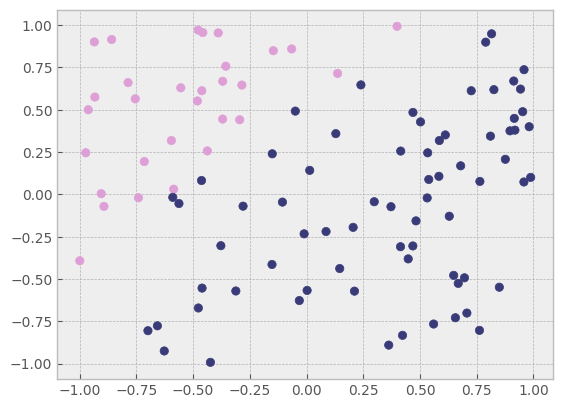

In [71]:
plt.scatter(x_data2[0], x_data2[1], c=linear01, cmap='tab20b', label='x_data2')
plt.show()

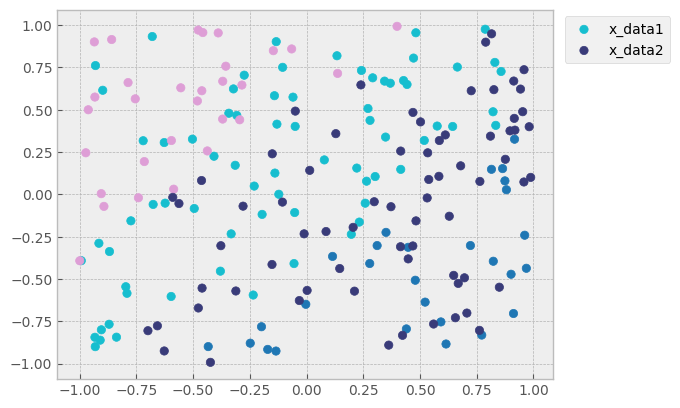

In [79]:
plt.scatter(x_data1[0], x_data1[1], c=linear00, cmap='tab10', label='x_data1')
plt.scatter(x_data2[0], x_data2[1], c=linear01, cmap='tab20b', label='x_data2')
plt.legend(bbox_to_anchor=(1.25, 1), loc='upper right')
plt.show()

In [83]:
x_data3 = tf.random.uniform([100, 2], -1, 1, dtype='float32')
x_data3

<tf.Tensor: id=492243, shape=(100, 2), dtype=float32, numpy=
array([[-0.2816174 , -0.7701938 ],
       [ 0.41256475,  0.44763517],
       [-0.73504615, -0.27551007],
       [ 0.93739057, -0.20544791],
       [-0.14315033, -0.22244549],
       [ 0.31479812,  0.70554805],
       [ 0.2960384 ,  0.5227778 ],
       [ 0.24985051, -0.3949771 ],
       [ 0.05176067,  0.83874464],
       [-0.43844318, -0.62181354],
       [-0.8168514 ,  0.09101367],
       [ 0.9841769 ,  0.5405228 ],
       [-0.61797476,  0.5842273 ],
       [-0.42588878,  0.03152895],
       [ 0.42337132,  0.97667384],
       [-0.82600546,  0.68468475],
       [ 0.4520352 , -0.38823247],
       [ 0.02141023, -0.6595361 ],
       [-0.25759363,  0.5851884 ],
       [-0.99913836,  0.30423546],
       [-0.3965447 , -0.9529877 ],
       [ 0.41962743,  0.50164247],
       [-0.42996955, -0.62133026],
       [ 0.71559095,  0.8934417 ],
       [-0.36867857,  0.24526668],
       [-0.47712374,  0.18430853],
       [ 0.8612752 ,  0.91392

In [85]:
tf.matmul(x_data3, w0) + b0

<tf.Tensor: id=492249, shape=(100, 2), dtype=float32, numpy=
array([[ -0.5985708 , -14.014008  ],
       [  4.946276  ,  -6.857261  ],
       [  8.454269  ,  -1.5377388 ],
       [ -6.322934  , -22.368279  ],
       [  3.5021527 ,  -8.534124  ],
       [  8.3841305 ,  -2.1564803 ],
       [  6.7620425 ,  -4.3420796 ],
       [ -1.8270183 , -15.941487  ],
       [ 12.125059  ,   3.0368748 ],
       [  2.3093545 , -10.000843  ],
       [ 12.811534  ,   4.3991957 ],
       [  0.5729575 , -13.060314  ],
       [ 15.817876  ,   8.368053  ],
       [  8.611803  ,  -1.478827  ],
       [ 10.043707  ,   0.03503323],
       [ 18.728506  ,  12.410429  ],
       [ -3.6304178 , -18.482674  ],
       [ -2.3136358 , -16.485981  ],
       [ 12.494769  ,   3.6915112 ],
       [ 16.591919  ,   9.605654  ],
       [ -1.3316016 , -14.948579  ],
       [  5.411542  ,  -6.231202  ],
       [  2.235744  , -10.104678  ],
       [  6.523781  ,  -4.873828  ],
       [ 10.182558  ,   0.61812496],
       [ 10.58

In [88]:
hypothesis0 = tf.sigmoid(tf.matmul(x_data3, w0) + b0)
hypothesis0

<tf.Tensor: id=492264, shape=(100, 2), dtype=float32, numpy=
array([[3.54670733e-01, 7.74860382e-07],
       [9.92940307e-01, 1.05065107e-03],
       [9.99787033e-01, 1.76864207e-01],
       [1.79147720e-03, 0.00000000e+00],
       [9.70748901e-01, 1.96635723e-04],
       [9.99771595e-01, 1.03727162e-01],
       [9.98844504e-01, 1.28423870e-02],
       [1.38593882e-01, 1.19209290e-07],
       [9.99994636e-01, 9.54212427e-01],
       [9.09648895e-01, 4.53591347e-05],
       [9.99997258e-01, 9.87861872e-01],
       [6.39445305e-01, 2.11596489e-06],
       [9.99999762e-01, 9.99767900e-01],
       [9.99818087e-01, 1.85604662e-01],
       [9.99956489e-01, 5.08757412e-01],
       [1.00000000e+00, 9.99995887e-01],
       [2.58207321e-02, 0.00000000e+00],
       [8.99999440e-02, 8.94069672e-08],
       [9.99996305e-01, 9.75672305e-01],
       [9.99999881e-01, 9.99932647e-01],
       [2.08894551e-01, 3.57627869e-07],
       [9.95555103e-01, 1.96319818e-03],
       [9.03413773e-01, 4.09185886e-0

In [90]:
hypothesis1 = tf.sigmoid(tf.matmul(hypothesis0, w1) + b1)
hypothesis1

<tf.Tensor: id=492274, shape=(100, 1), dtype=float32, numpy=
array([[8.93024445e-01],
       [1.90138817e-04],
       [3.51256132e-03],
       [9.99678493e-01],
       [2.71797180e-04],
       [9.96649265e-04],
       [2.10970640e-04],
       [9.96817946e-01],
       [9.99576807e-01],
       [7.55131245e-04],
       [9.99763131e-01],
       [6.56497478e-02],
       [9.99807119e-01],
       [4.08023596e-03],
       [5.19582987e-01],
       [9.99807894e-01],
       [9.99518931e-01],
       [9.98589337e-01],
       [9.99707699e-01],
       [9.99807715e-01],
       [9.89724219e-01],
       [1.84893608e-04],
       [8.38249922e-04],
       [1.93774700e-04],
       [9.25033569e-01],
       [9.90240932e-01],
       [1.83880329e-04],
       [2.72214413e-04],
       [2.61664391e-04],
       [9.99757409e-01],
       [6.89417124e-04],
       [9.99676287e-01],
       [9.99676347e-01],
       [1.83492899e-04],
       [4.49061394e-04],
       [2.22891569e-04],
       [9.99807894e-01],
       [9.9978

In [93]:
hypothesis1 = np.where(hypothesis1 > 0.5, 1, 0)
hypothesis1

array([[1],
       [0],
       [0],
       [1],
       [0],
       [0],
       [0],
       [1],
       [1],
       [0],
       [1],
       [0],
       [1],
       [0],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [0],
       [0],
       [0],
       [1],
       [1],
       [0],
       [0],
       [0],
       [1],
       [0],
       [1],
       [1],
       [0],
       [0],
       [0],
       [1],
       [1],
       [0],
       [1],
       [1],
       [1],
       [1],
       [1],
       [0],
       [1],
       [0],
       [1],
       [1],
       [1],
       [1],
       [0],
       [0],
       [1],
       [0],
       [0],
       [1],
       [0],
       [0],
       [1],
       [0],
       [1],
       [1],
       [1],
       [1],
       [0],
       [0],
       [1],
       [1],
       [0],
       [1],
       [0],
       [0],
       [0],
       [1],
       [1],
       [0],
       [1],
       [0],
       [1],
       [1],
       [0],
       [1],
    

In [99]:
hypothesis1 = hypothesis1.flatten()

In [102]:
# .numpy() -> numpy 배열로 변환
x_data3.numpy().T

array([[-0.2816174 ,  0.41256475, -0.73504615,  0.93739057, -0.14315033,
         0.31479812,  0.2960384 ,  0.24985051,  0.05176067, -0.43844318,
        -0.8168514 ,  0.9841769 , -0.61797476, -0.42588878,  0.42337132,
        -0.82600546,  0.4520352 ,  0.02141023, -0.25759363, -0.99913836,
        -0.3965447 ,  0.41962743, -0.42996955,  0.71559095, -0.36867857,
        -0.47712374,  0.8612752 , -0.87290215, -0.52305245, -0.63832927,
        -0.7505796 ,  0.49324822,  0.08448482,  0.6310284 ,  0.42902112,
         0.05886507, -0.7845123 ,  0.055269  , -0.04080248, -0.8802607 ,
        -0.651952  ,  0.99448824,  0.36695552,  0.25562477, -0.8862791 ,
         0.34091496,  0.38369298, -0.94618726, -0.13444924, -0.7728121 ,
         0.27759767, -0.69725466,  0.43106318,  0.4868958 ,  0.6126611 ,
        -0.32755136,  0.10885549, -0.9631679 , -0.8123839 ,  0.46692014,
        -0.07393336, -0.0332973 ,  0.14646697, -0.74147606,  0.07013774,
        -0.33326912,  0.9323242 , -0.41694117, -0.6

In [105]:
x_data3.numpy().T[1]

array([-0.7701938 ,  0.44763517, -0.27551007, -0.20544791, -0.22244549,
        0.70554805,  0.5227778 , -0.3949771 ,  0.83874464, -0.62181354,
        0.09101367,  0.5405228 ,  0.5842273 ,  0.03152895,  0.97667384,
        0.68468475, -0.38823247, -0.6595361 ,  0.5851884 ,  0.30423546,
       -0.9529877 ,  0.50164247, -0.62133026,  0.8934417 ,  0.24526668,
        0.18430853,  0.91392064, -0.5623174 , -0.57138133,  0.25756145,
       -0.35655713, -0.6029799 ,  0.9031856 ,  0.7342694 ,  0.7690363 ,
        0.02270508,  0.73801684,  0.98453546,  0.1504054 ,  0.9293089 ,
        0.02756453, -0.8060162 , -0.53003216, -0.22903728, -0.41584373,
       -0.76899004,  0.01853633,  0.51662254, -0.8732505 ,  0.43603492,
       -0.87671614, -0.5716653 ,  0.12120962, -0.37086797,  0.8306067 ,
        0.21214843,  0.8659215 , -0.41805696, -0.3483305 , -0.06525254,
       -0.10645676, -0.8446176 ,  0.9969337 ,  0.24075794, -0.4839697 ,
       -0.24210358,  0.83333683,  0.59916115, -0.00319409, -0.29

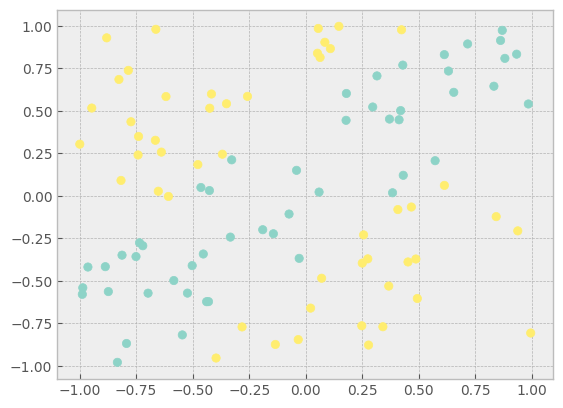

In [110]:
plt.scatter(x_data3.numpy().T[0], x_data3.numpy().T[1], c=hypothesis1, cmap='Set3')
plt.show()

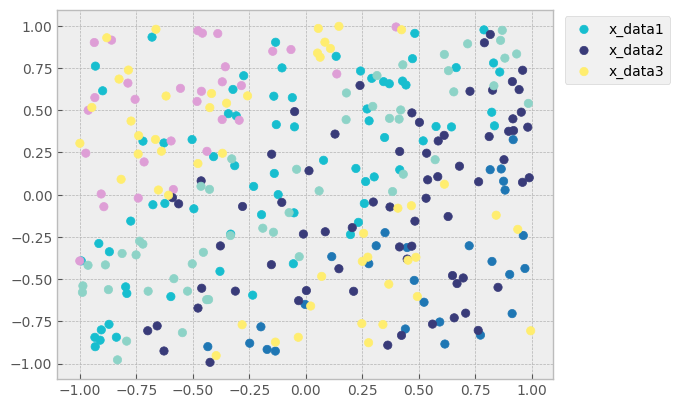

In [114]:
plt.scatter(x_data1[0], x_data1[1], c=linear00, cmap='tab10', label='x_data1')
plt.scatter(x_data2[0], x_data2[1], c=linear01, cmap='tab20b', label='x_data2')
plt.scatter(x_data3.numpy().T[0], x_data3.numpy().T[1], c=hypothesis1, cmap='Set3', label='x_data3')
plt.legend(bbox_to_anchor=(1.25, 1), loc='upper right')
plt.show()